In [1]:
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

from glob import glob

import IPython.display as ipd
from tqdm import tqdm

import subprocess

plt.style.use('ggplot')

In [2]:
input_file = '/content/drive/MyDrive/026c7465-309f6d33.mov'
subprocess.run(['ffmpeg',
                '-i',
                input_file,
                '-qscale',
                '0',
                '026c7465-309f6d33.mp4',
                '-loglevel',
                'quiet']
              )

CompletedProcess(args=['ffmpeg', '-i', '/content/drive/MyDrive/026c7465-309f6d33.mov', '-qscale', '0', '026c7465-309f6d33.mp4', '-loglevel', 'quiet'], returncode=0)

In [3]:
!ls -GFlash --color

total 14M
4.0K drwxr-xr-x 1 root 4.0K Aug 26 11:58 ./
4.0K drwxr-xr-x 1 root 4.0K Aug 26 11:55 ../
 14M -rw-r--r-- 1 root  14M Aug 26 12:00 026c7465-309f6d33.mp4
4.0K drwxr-xr-x 4 root 4.0K Aug 24 21:24 .config/
4.0K drwx------ 5 root 4.0K Aug 26 11:57 drive/
4.0K drwxr-xr-x 1 root 4.0K Aug 24 21:25 sample_data/


In [4]:
ipd.Video('026c7465-309f6d33.mp4', width=700)

In [5]:
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')

In [7]:
cap.get(cv2.CAP_PROP_FRAME_COUNT)

2398.0

In [10]:
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
print(f'Height {height}, Width {width}')

Height 720.0, Width 1280.0


In [11]:
fps = cap.get(cv2.CAP_PROP_FPS)
print(f'FPS : {fps:0.2f}')

FPS : 59.94


In [12]:
cap.release()

In [13]:
cap = cv2.VideoCapture('026c7465-309f6d33.mp4')
ret, img = cap.read()
print(f'Returned {ret} and img of shape {img.shape}')

Returned True and img of shape (720, 1280, 3)


In [14]:
def display_cv2_img(img, figsize=(10, 10)):
    img_ = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(img_)
    ax.axis("off")

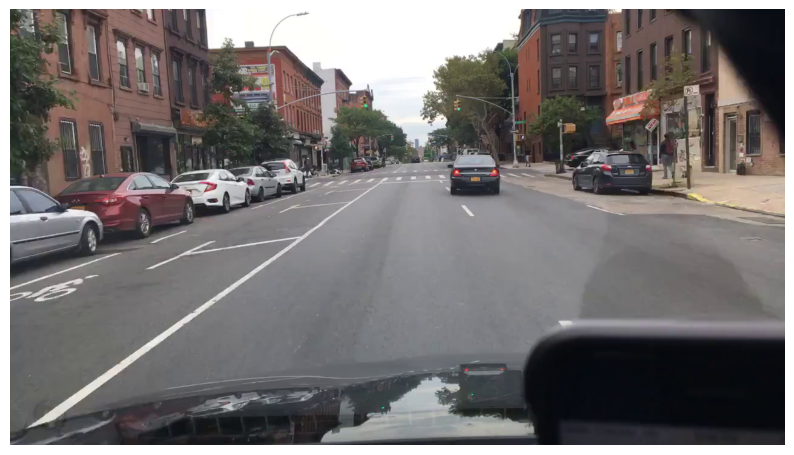

In [15]:
display_cv2_img(img)

In [16]:
cap.release()

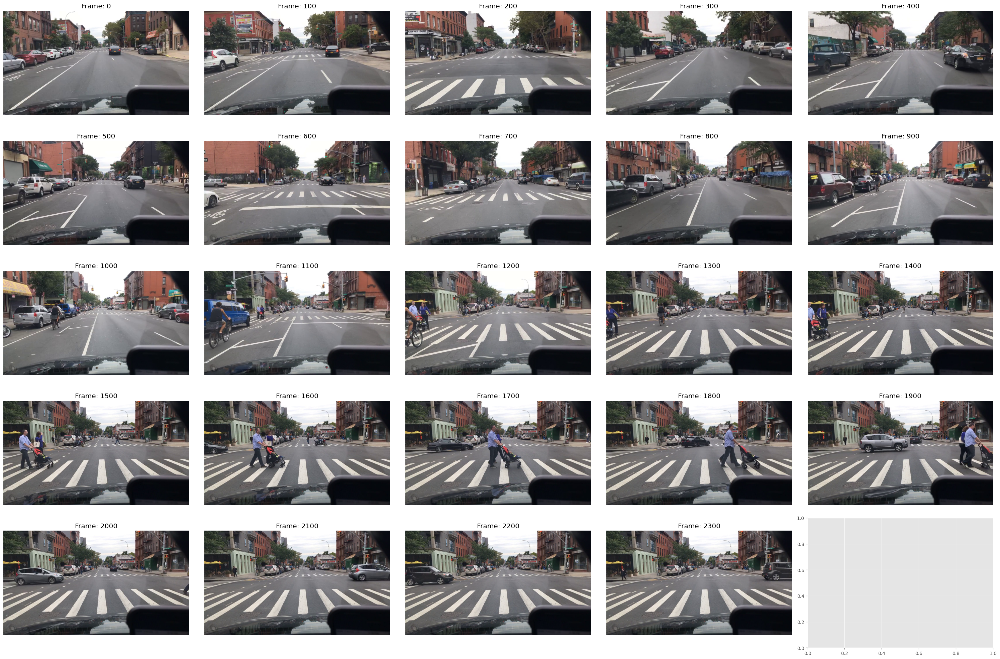

In [18]:
fig, axs = plt.subplots(5, 5, figsize=(30, 20))
axs = axs.flatten()

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame % 100 == 0:
        axs[img_idx].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[img_idx].set_title(f'Frame: {frame}')
        axs[img_idx].axis('off')
        img_idx += 1

plt.tight_layout()
plt.show()
cap.release()

In [19]:
labels = pd.read_csv('/content/drive/MyDrive/mot_labels.csv',
                     low_memory=False)
video_labels = (
    labels.query('videoName == "026c7465-309f6d33"').reset_index(drop=True).copy()
)
video_labels["video_frame"] = (video_labels["frameIndex"] * 11.9).round().astype("int")

In [20]:
video_labels["category"].value_counts()

car              3030
pedestrian        847
bicycle           381
rider             320
truck             194
other vehicle     115
bus               109
other person       74
motorcycle         67
trailer            34
Name: category, dtype: int64

In [21]:
cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

img_idx = 0
for frame in range(n_frames):
    ret, img = cap.read()
    if ret == False:
        break
    if frame == 1035:
        break
cap.release()

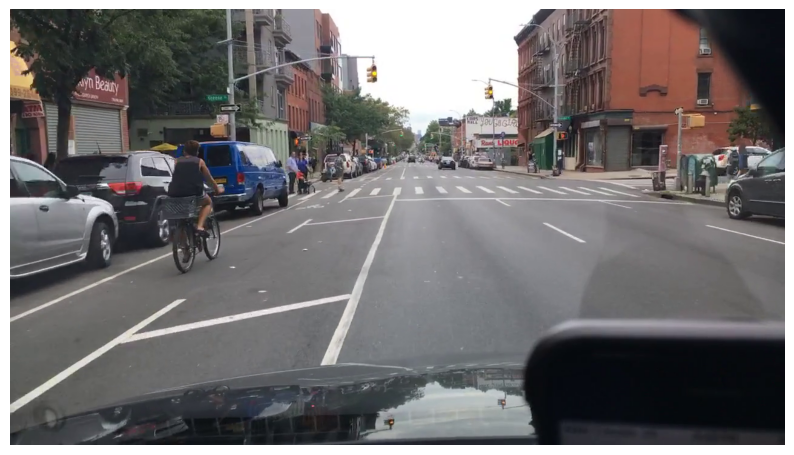

In [22]:
display_cv2_img(img)

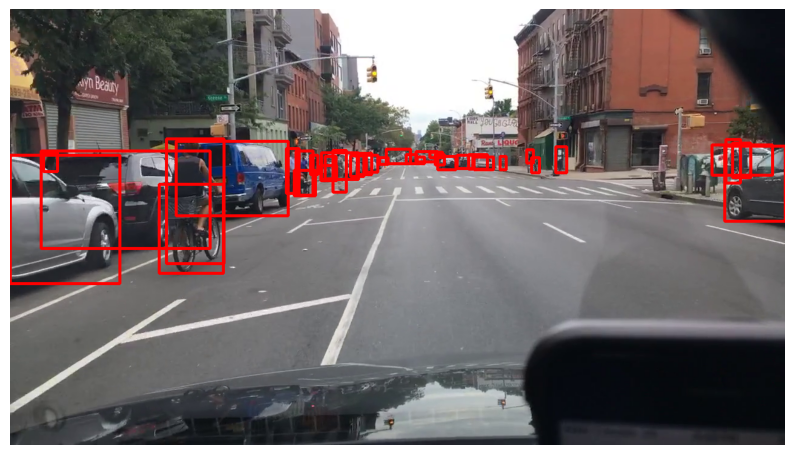

In [23]:
img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    cv2.rectangle(img_example, pt1, pt2, (0, 0, 255), 3)

display_cv2_img(img_example)

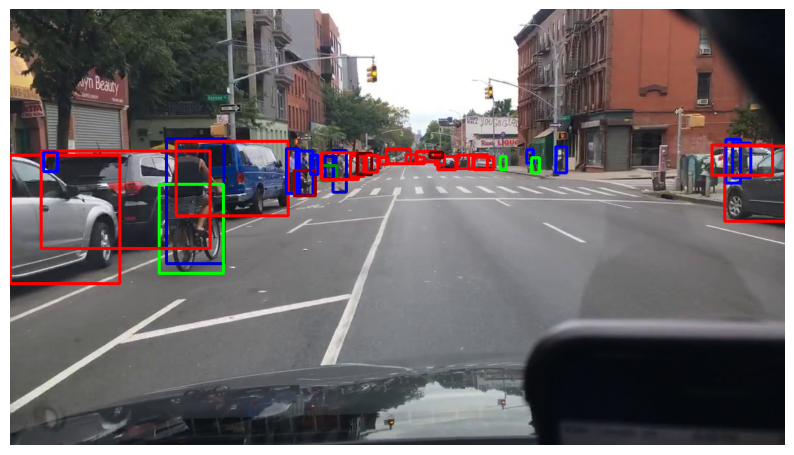

In [24]:
color_map = {
    "car": (0, 0, 255),
    "truck": (0, 0, 100),
    "pedestrian": (255, 0, 0),
    "other vehicle": (0, 0, 150),
    "rider": (200, 0, 0),
    "bicycle": (0, 255, 0),
    "other person": (200, 0, 0),
    "trailer": (0, 150, 150),
    "motorcycle": (0, 150, 0),
    "bus": (0, 0, 100),
}

img_example = img.copy()
frame_labels = video_labels.query('video_frame == 1035')
for i, d in frame_labels.iterrows():
    pt1 = int(d['box2d.x1']), int(d['box2d.y1'])
    pt2 = int(d['box2d.x2']), int(d['box2d.y2'])
    color = color_map[d['category']]
    cv2.rectangle(img_example, pt1, pt2, color, 3)

display_cv2_img(img_example)

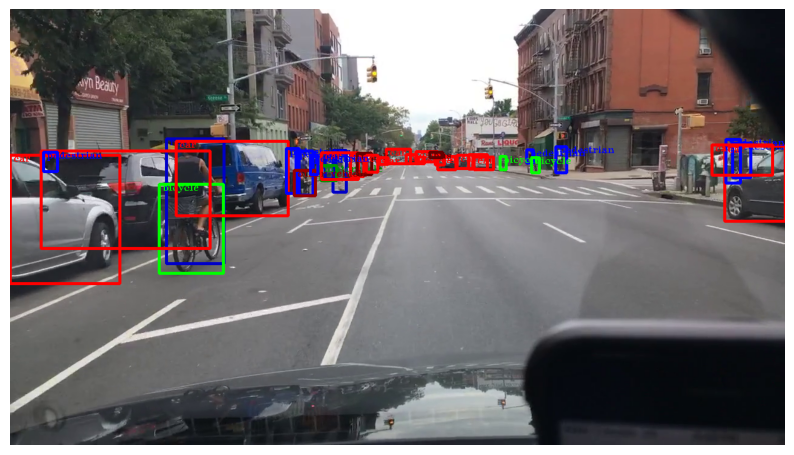

In [26]:
frame_labels = video_labels[video_labels["video_frame"] == frame]
font = cv2.FONT_HERSHEY_TRIPLEX
img_example = img.copy()
for i, d in frame_labels.iterrows():
    pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
    pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
    color = color_map[d["category"]]
    img_example = cv2.rectangle(img_example, pt1, pt2, color, 3)
    pt_text = int(d["box2d.x1"]) + 5, int(d["box2d.y1"] + 10)
    img_example = cv2.putText(img_example, d["category"], pt_text, font, 0.5, color)
display_cv2_img(img_example)
cap.release()

In [32]:
def add_annotations(img, frame, frame_labels):
    for i, d in frame_labels.iterrows():
        pt1 = int(d["box2d.x1"]), int(d["box2d.y1"])
        pt2 = int(d["box2d.x2"]), int(d["box2d.y2"])
        color = color_map[d["category"]]
        img = cv2.rectangle(img, pt1, pt2, color, 3)
    return img

In [33]:
VIDEO_CODEC = "mp4v"
fps = 59.94
width = 1280
height = 720
out = cv2.VideoWriter("out_test.mp4",
                     cv2.VideoWriter_fourcc(*VIDEO_CODEC),
                     fps,
                     (width, height))

cap = cv2.VideoCapture("026c7465-309f6d33.mp4")
n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

for frame in tqdm(range(n_frames), total=n_frames):
    ret, img = cap.read()
    if not ret:
        break

    # Assuming you have a DataFrame 'video_labels' containing the labels
    frame_labels = video_labels[video_labels["video_frame"] <= frame]
    img = add_annotations(img, frame, frame_labels)
    out.write(img)

out.release()
cap.release()

100%|██████████| 2398/2398 [09:05<00:00,  4.40it/s]


In [34]:
!ls -GFlash -color

total 87M
4.0K drwxr-xr-x 1 root 4.0K Aug 24 22:14 sample_data/
 74M -rw-r--r-- 1 root  74M Aug 26 12:40 out_test.mp4
4.0K drwx------ 5 root 4.0K Aug 26 11:57 drive/
4.0K drwxr-xr-x 4 root 4.0K Aug 24 22:14 .config/
 14M -rw-r--r-- 1 root  14M Aug 26 12:00 026c7465-309f6d33.mp4
4.0K drwxr-xr-x 1 root 4.0K Aug 26 11:57 ../
4.0K drwxr-xr-x 1 root 4.0K Aug 26 12:23 ./


In [35]:
tmp_output_path = "out_test.mp4"
output_path = "out_test_compressed.mp4"
subprocess.run(
    [
        "ffmpeg",
        "-i",
        tmp_output_path,
        "-crf",
        "18",
        "-preset",
        "veryfast",
        "-vcodec",
        "libx264",
        output_path,
        '-loglevel',
        'quiet'
    ]
)

CompletedProcess(args=['ffmpeg', '-i', 'out_test.mp4', '-crf', '18', '-preset', 'veryfast', '-vcodec', 'libx264', 'out_test_compressed.mp4', '-loglevel', 'quiet'], returncode=0)

In [36]:
!ls -GFlash --color

total 110M
4.0K drwxr-xr-x 1 root 4.0K Aug 26 12:40 ./
4.0K drwxr-xr-x 1 root 4.0K Aug 26 11:55 ../
 14M -rw-r--r-- 1 root  14M Aug 26 12:00 026c7465-309f6d33.mp4
4.0K drwxr-xr-x 4 root 4.0K Aug 24 21:24 .config/
4.0K drwx------ 5 root 4.0K Aug 26 11:57 drive/
 23M -rw-r--r-- 1 root  23M Aug 26 12:41 out_test_compressed.mp4
 74M -rw-r--r-- 1 root  74M Aug 26 12:40 out_test.mp4
4.0K drwxr-xr-x 1 root 4.0K Aug 24 21:25 sample_data/


In [37]:
ipd.Video('out_test_compressed.mp4', width=600)